# **TRAINING**

Full image, two class

In [1]:
# Import necessary libraries
import os
import warnings
import logging
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
from tensorflow.keras import Model as tfkModel
import matplotlib.pyplot as plt
import pandas as pd
from keras.utils import register_keras_serializable
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
from keras.callbacks import Callback
import IPython.display as display
from PIL import Image
import matplotlib.gridspec as gridspec
import json
import keras_cv
from tqdm import tqdm
from collections import Counter
import albumentations as A
import cv2 
from scipy.signal import correlate2d

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.1 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

## **DISTRIBUTION DEFINITIONS**

In [3]:
def auto_select_accelerator():
    """
    Reference:
        * https://www.kaggle.com/mgornergoogle/getting-started-with-100-flowers-on-tpu
        * https://www.kaggle.com/xhlulu/ranzcr-efficientnet-tpu-training
    """
    try:
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
        tf.config.experimental_connect_to_cluster(tpu)
        tf.tpu.experimental.initialize_tpu_system(tpu)
        strategy = tf.distribute.TPUStrategy(tpu)
        print("Running on TPU:", tpu.master())
    except ValueError:
        strategy = tf.distribute.get_strategy()
    print(f"Running on {strategy.num_replicas_in_sync} replicas")

    return strategy

In [4]:
# Setting che correct strategy for TPU / batch sizes
strategy = auto_select_accelerator()
numGPU = len(tf.config.list_physical_devices('GPU'))
numTPU = len(tf.config.list_logical_devices('TPU'))
print("Num GPUs Available: ", numGPU)
print("Num TPUs Available: ", numTPU)

Running on 1 replicas
Num GPUs Available:  1
Num TPUs Available:  0


In [5]:
batch_size = 32
if numTPU != 0:
    batch_size = strategy.num_replicas_in_sync * 32

print(f"Batch size: {batch_size}")

Batch size: 32


## **DATA PREPROCESSING**

In [6]:
data_path = "/kaggle/input/lung-cancer/lung_dataset_padded.npz"
print(f"reading {data_path}")

reading /kaggle/input/lung-cancer/lung_dataset_padded.npz


In [7]:
def transform_labels_to_binary(labels, threshold=3): 
    new_labels = [0 if label <= threshold else 1 for label in labels]
    return new_labels

In [8]:
data = np.load(data_path, allow_pickle=True)

X = data['full_slices']

# Preprocess target 
y = np.expand_dims(np.array(transform_labels_to_binary(data['tumor_classes'])), axis=-1)

In [9]:
y.shape

(2363, 1)

In [10]:
def plot_distribution(y):
    # Ensure y_train is converted to a list
    label_counts = Counter(y.ravel().tolist())
    
    # Total number of samples
    total_samples = sum(label_counts.values())
    
    # Calculate percentages
    label_percentages = {label: (count / total_samples) * 100 for label, count in label_counts.items()}
    
    # Print percentages
    print("Label Percentages:")
    for label, percentage in label_percentages.items():
        print(f"Label {label}: {percentage:.2f}%")
    
    # Plot the distribution of labels
    plt.bar(label_counts.keys(), label_counts.values())
    plt.xlabel('Label')
    plt.ylabel('Count')
    plt.title('Distribution of Labels in the Training Dataset')
    plt.show()

Label Percentages:
Label 1: 24.12%
Label 0: 75.88%


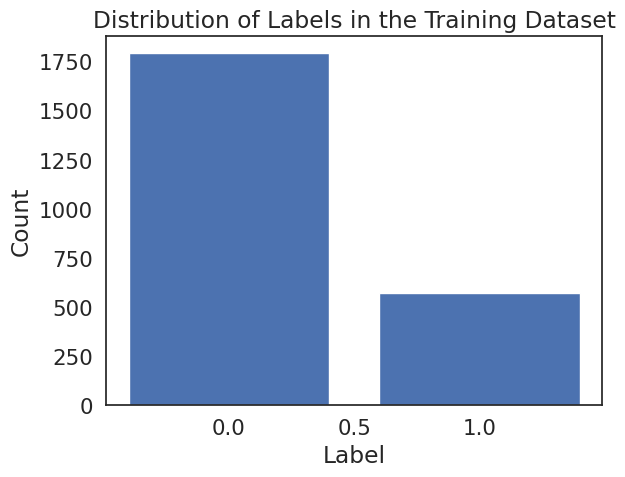

In [11]:
plot_distribution(y)

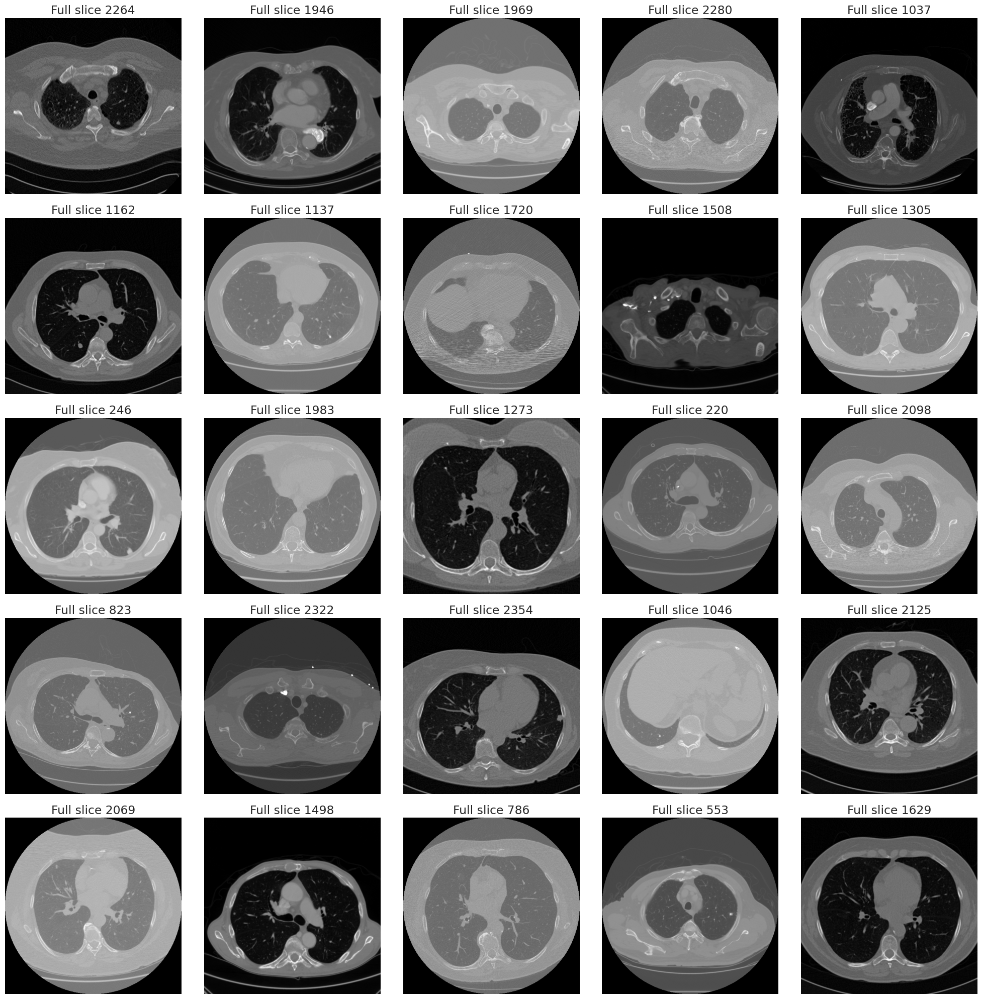

In [12]:
# Pick 25 random indices
random_indices = random.sample(range(len(X)), 25)

# Plot the full slices with bounding boxes and nodules side by side
plt.figure(figsize=(20, 40))
for i, idx in enumerate(random_indices):
    nodule = X[idx]
    
    plt.subplot(10, 5, i+1)
    plt.imshow(nodule, cmap='gray')
    plt.title(f'Full slice {idx}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [13]:
def mohammad_paper_preprocessing(X, y, augment=False, preprocess=True, copies_per_label=None):
    def plot_image(image, title='Image'):
        """
        Plots a given image using matplotlib.
    
        Args:
            image (numpy.ndarray): The image to plot.
            title (str): The title of the plot.
        """
        plt.imshow(image.squeeze(), cmap='gray')
        plt.title(title)
        plt.axis('off')
        plt.show()
        
    def normalize(img):
        min_val = np.min(img)
        max_val = np.max(img)
        if max_val == min_val:  # Handle uniform images
            return np.zeros_like(img)
        return (img - min_val) / (max_val - min_val)
    
    def img_preprocessing(img):
        img = cv2.medianBlur(img, 3)
        img = cv2.equalizeHist(img)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        img = clahe.apply(img)
        kernel = np.ones((3, 3), np.uint8)
        img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
        return img

    def augmentation(image):
        # try:
        transform = A.Compose([
            A.Rotate(limit=30, p=0.5),  # Random Rotation
            A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),  # Combined shift, scale, rotate
            A.ElasticTransform(alpha=1, sigma=50, alpha_affine=None, p=0.3),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5)
        ])
        return transform(image=image)['image'] 
        # except Exception as e:
        #     plot_image(image)

    # Preprocessing step
    new_X = np.zeros_like(X, dtype=np.uint8)  # Shape: (num_samples, height, width)

    for i in range(X.shape[0]):
        # Normalize and scale to [0, 255]
        normalized_img = normalize(X[i])
        scaled_img = (normalized_img * 255).astype(np.uint8)  # Shape: (512, 512)
        new_X[i] = scaled_img  # No need to add extra dimensions
    
        # Apply preprocessing if needed
        if preprocess:
            new_X[i] = img_preprocessing(new_X[i])  # Ensure preprocessing works with 2D images
    
    # Augmentation step
    if augment and copies_per_label:
        augmented_X = []
        augmented_y = []
        for label, copies in copies_per_label.items():
            # Find all images with the current label
            label_indices = np.where(y == label)[0]
            for idx in label_indices:
                for _ in range(copies):
                    aug_img = augmentation(new_X[idx])
                    augmented_X.append(aug_img)
                    augmented_y.append(label)
        
        # Append augmented data to the original dataset
        new_X = np.concatenate((new_X, np.array(augmented_X)), axis=0)
        y = np.concatenate((y, np.expand_dims(np.array(augmented_y), axis = -1)), axis=0)
    
    return new_X, y

In [14]:
X, y = mohammad_paper_preprocessing(X, y)

/tmp/ipykernel_30/3517942618.py:20: RuntimeWarning: overflow encountered in scalar subtract
  return (img - min_val) / (max_val - min_val)


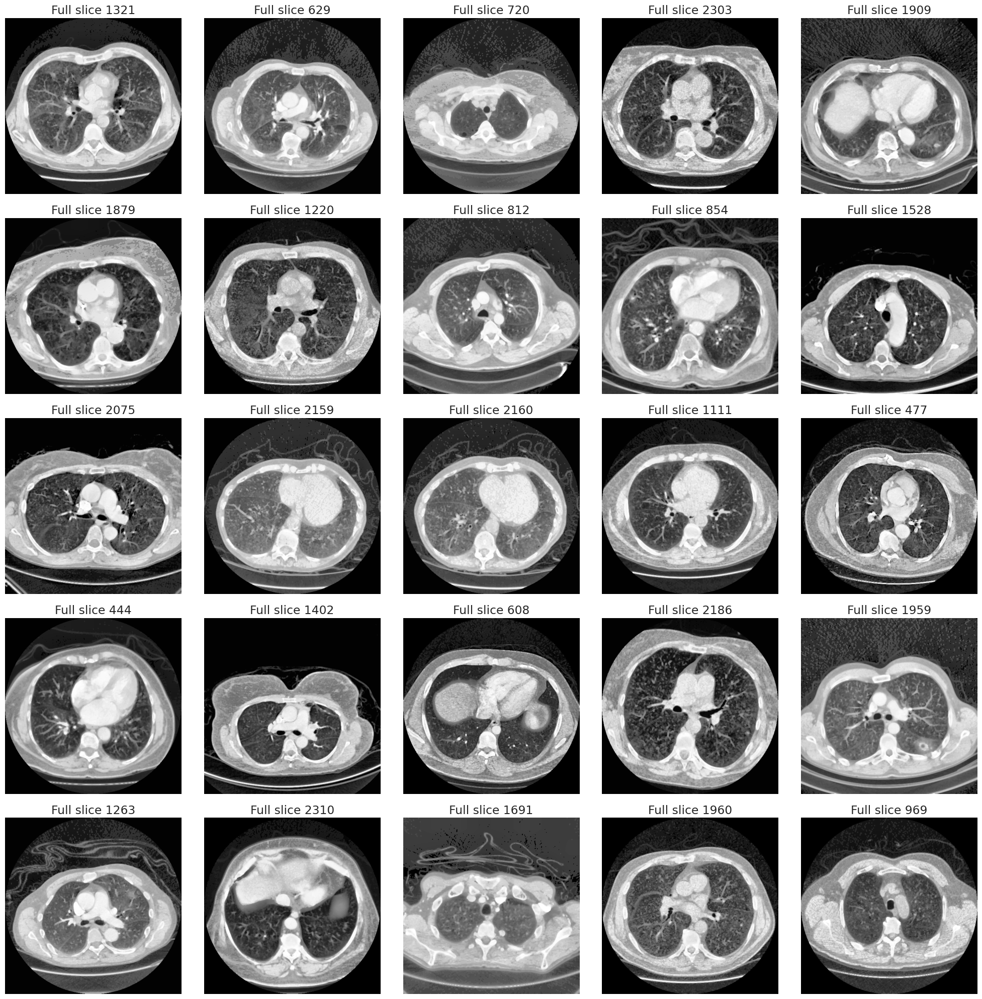

In [15]:
# Pick 25 random indices
random_indices = random.sample(range(len(X)), 25)

# Plot the full slices with bounding boxes and nodules side by side
plt.figure(figsize=(20, 40))
for i, idx in enumerate(random_indices):
    nodule = X[idx]
    
    plt.subplot(10, 5, i+1)
    plt.imshow(nodule, cmap='gray')
    plt.title(f'Full slice {idx}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [16]:
X = np.expand_dims(X, axis = -1)

In [17]:
# Split Train and Test
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.2, stratify=y)

Label Percentages:
Label 1: 48.82%
Label 0: 51.18%


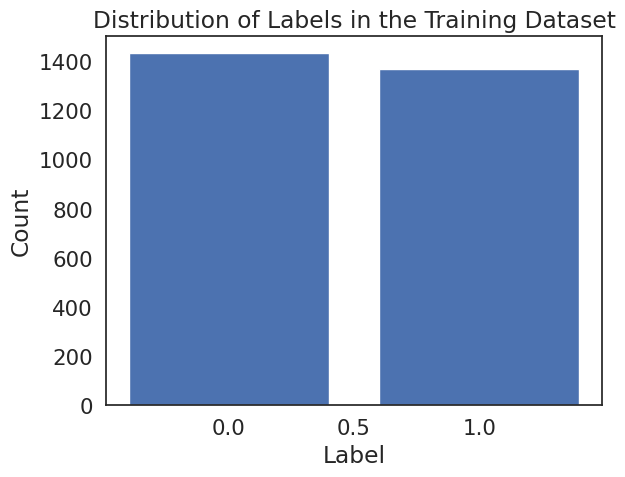

In [18]:
X_train, y_train = mohammad_paper_preprocessing(X_train, y_train, preprocess = False, augment = True, copies_per_label={0: 0, 1: 2})
plot_distribution(y_train)

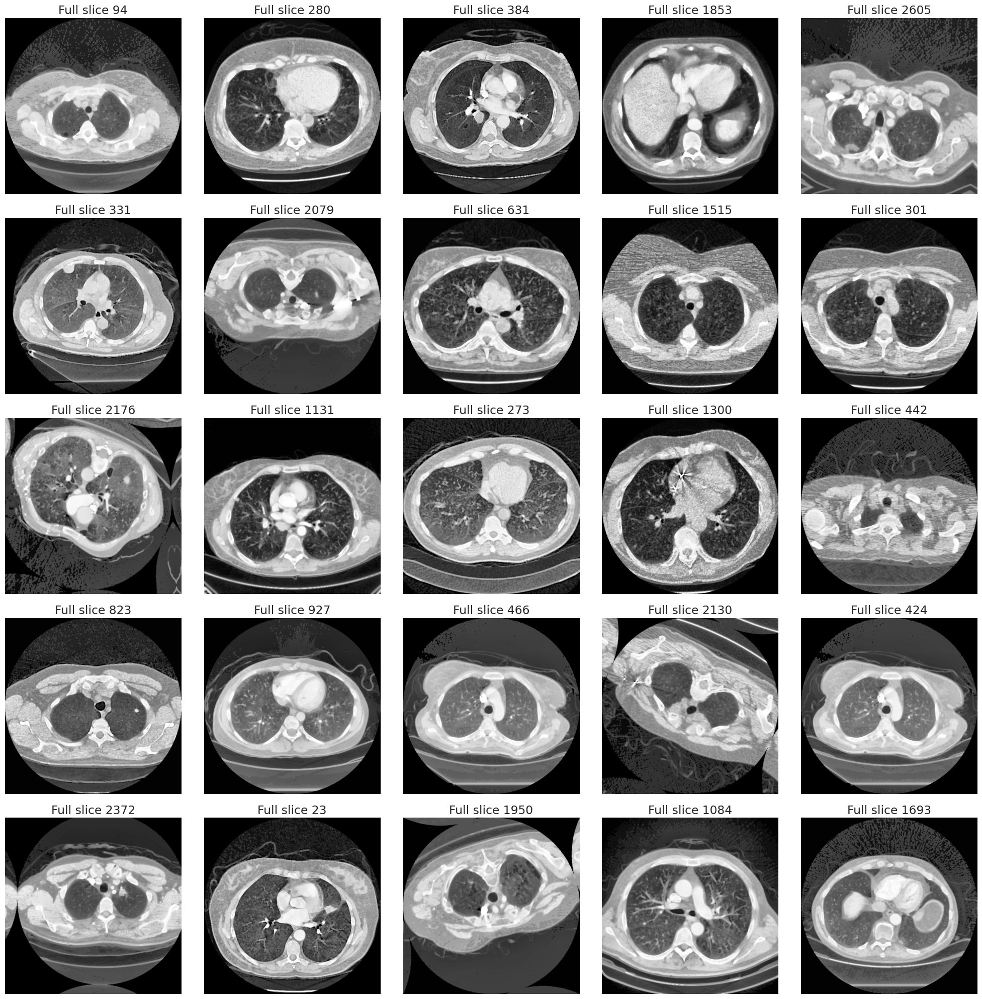

In [19]:
# Pick 25 random indices
random_indices = random.sample(range(len(X_train)), 25)

# Plot the full slices with bounding boxes and nodules side by side
plt.figure(figsize=(20, 40))
for i, idx in enumerate(random_indices):
    nodule = X_train[idx]
    
    plt.subplot(10, 5, i+1)
    plt.imshow(nodule, cmap='gray')
    plt.title(f'Full slice {idx}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [20]:
# Print the shapes of the loaded datasets
print("Training Training Shape:", X_train.shape)
print("Training Label Shape:", y_train.shape)
print("Validation Training Shape:", X_val.shape)
print("Validation Label Shape:", y_val.shape)

Training Training Shape: (2802, 512, 512, 1)
Training Label Shape: (2802, 1)
Validation Training Shape: (473, 512, 512, 1)
Validation Label Shape: (473, 1)


In [21]:
# Input shape for the model
input_shape = X_train.shape[1:]

# Output shape for the model
output_shape = y_train.shape[1]

print("Input Train Shape: ", input_shape)
print("Output Shape: ", output_shape)

Input Train Shape:  (512, 512, 1)
Output Shape:  1


## **CUSTOM CALLBACKS AND METRICS DEFINITIONS**

In [22]:
# Custom implementation of ReduceLROnPlateau
class CustomReduceLROnPlateau(tf.keras.callbacks.Callback):
    def __init__(self, monitor='val_accuracy', factor=0.33, patience=20, min_lr=1e-8, verbose=1):
        super(CustomReduceLROnPlateau, self).__init__()
        self.monitor = monitor
        self.factor = factor
        self.patience = patience
        self.min_lr = min_lr
        self.verbose = verbose
        self.wait = 0
        self.best = None
        self.new_lr = None

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get(self.monitor)
        
        # Initialize best metric if it's the first epoch
        if self.best is None:
            self.best = current
            return

        # Check if the monitored metric has improved
        if current > self.best:
            self.best = current
            self.wait = 0
        else:
            self.wait += 1

            # If patience is exceeded, reduce the learning rate
            if self.wait >= self.patience:
                old_lr = float(tf.keras.backend.get_value(self.model.optimizer.learning_rate))
                if old_lr == self.min_lr:
                    return
                self.new_lr = max(old_lr * self.factor, self.min_lr)
                self.model.optimizer.learning_rate.assign(self.new_lr)
                
                if self.verbose > 0:
                    print(f"\nEpoch {epoch + 1}: reducing learning rate to {self.new_lr}.")
                
                self.wait = 0  # Reset patience counter

In [23]:
# Custom callback class for real-time plotting
class RealTimePlot(Callback):
    def on_train_begin(self, logs=None):
        # Initialize the lists that will store the metrics
        self.epochs = []
        self.train_loss = []
        self.val_loss = []
        self.train_acc = []
        self.val_acc = []

        # Set up the plot
        self.fig, (self.ax_loss, self.ax_acc) = plt.subplots(1, 2, figsize=(14, 5))
        plt.show()

    def on_epoch_end(self, epoch, logs=None):
        # Append the metrics to the lists
        self.epochs.append(epoch)
        self.train_loss.append(logs['loss'])
        self.val_loss.append(logs['val_loss'])
        self.train_acc.append(logs['binary_accuracy'])
        self.val_acc.append(logs['val_binary_accuracy'])

        # Clear the previous output
        display.clear_output(wait=True)

        # Plot training and validation loss
        self.ax_loss.clear()
        self.ax_loss.plot(self.epochs, self.train_loss, label='Training Loss')
        self.ax_loss.plot(self.epochs, self.val_loss, label='Validation Loss')
        self.ax_loss.set_title('Training and Validation Loss')
        self.ax_loss.set_xlabel('Epoch')
        self.ax_loss.set_ylabel('Loss')
        #self.ax_loss.set_ylim(top=2.5, bottom=0.0)
        self.ax_loss.legend()

        # Plot training and validation accuracy
        self.ax_acc.clear()
        self.ax_acc.plot(self.epochs, self.train_acc, label='Training Accuracy')
        self.ax_acc.plot(self.epochs, self.val_acc, label='Validation Accuracy')
        self.ax_acc.set_title('Training and Validation Accuracy')
        self.ax_acc.set_xlabel('Epoch')
        self.ax_acc.set_ylabel('Accuracy')
        self.ax_acc.legend()

        # Redraw the updated plots
        display.display(self.fig)
        plt.pause(0.1)

In [24]:
class DisplayLearningRateCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        # Get the current learning rate from the optimizer and display it
        lr = float(tf.keras.backend.get_value(self.model.optimizer.learning_rate))
        print(f"Epoch {epoch+1} : Learning rate = {tf.keras.backend.get_value(lr)}")

## **MODEL DEFINITION**

In [25]:
@register_keras_serializable()
class CustomCastLayer(tfk.layers.Layer):
    def call(self, inputs):
        return tf.cast(inputs * 255, tf.uint8)

@register_keras_serializable()
class CustomAugmentLayer(tfk.layers.Layer):
    def __init__(self, max_rotation=30.0, max_zoom=0.2, **kwargs):
        super(CustomAugmentLayer, self).__init__(**kwargs)
        self.max_rotation = max_rotation / 360.0
        self.max_zoom = max_zoom
        
    def call(self, inputs, training=False):
        if training:
            inputs = tf.image.random_flip_up_down(tf.image.random_flip_left_right(inputs))
        return inputs


In [26]:
def create_model(
            input_shape = input_shape,
            n_labels=output_shape, 
            base_model_trainable=False, #standard definitions
            n_dense_layers=1, 
            initial_dense_neurons=1024, 
            min_neurons=64, # architecture definitions
            include_dropout=False, 
            dropout_rate=0.3, 
            l2_lambda=4e-3, # against overfitting
            learning_rate=1e-3):
    
    # The input layer
    image_input = tfkl.Input(shape=input_shape, name='Input_Image')  
    
    # The two augmentation layers
    x = CustomCastLayer()(image_input)

    x = tfk.applications.efficientnet.preprocess_input(x)
    # x = CustomAugmentLayer()(x, training=False)

    base_model = tfk.applications.EfficientNetB0(
        include_top=False,
        weights="imagenet",
        input_shape=(None, None, 3),
        pooling="avg"
    )

    # Here we freeze the convnext to perform Tranfer Learning
    base_model.trainable = base_model_trainable

    x = base_model(x)
    x = tfkl.Dropout(dropout_rate, name=f'Dropout_layer_-1')(x)

    # Hidden layers building
    neurons = initial_dense_neurons
    for k in range(n_dense_layers):
        x = tfkl.Dense(units=neurons, activation='silu', name=f'Dense_layer_{k}', kernel_regularizer=tfk.regularizers.L2(l2_lambda))(x)
        if include_dropout:
            x = tfkl.Dropout(dropout_rate, name=f'Dropout_layer_{k}')(x)
        neurons = max(neurons // 2, min_neurons)
    outputs = tfkl.Dense(output_shape, activation='sigmoid', name='output_layer')(x)

    # Final model building
    model = tfk.Model(inputs=image_input, outputs=outputs, name='TF-CNN')

    # Compile the model
    loss = tfk.losses.BinaryCrossentropy()
    # Metrics definition
    METRICS = [tfk.metrics.BinaryAccuracy(), tfk.metrics.Recall(), tfk.metrics.F1Score()]
    optimizer = tf.keras.optimizers.AdamW(
                                learning_rate=learning_rate,
                                weight_decay=l2_lambda,
                                beta_1=0.9,
                                beta_2=0.999,
                                epsilon=1e-07,
                                amsgrad=False,
                                use_ema=False,
                                ema_momentum=0.99,
                                name="adamw"
                            )
                                
    model.compile(loss=loss, optimizer=optimizer, metrics=METRICS)

    # Return the model
    return model

## **TRANSFER LEARNING**

In [27]:
# Best values found so far
n_dense_layers = 0
dropout_rate = 0.3
include_dropout = True
l2_lambda = 0

epochs = 350

In [28]:
# Build the model with specified input and output shapes
with strategy.scope():
    model = create_model(n_dense_layers=n_dense_layers, include_dropout=include_dropout, dropout_rate=dropout_rate, l2_lambda=l2_lambda, base_model_trainable=True)

# Display a summary of the model architecture
model.summary(expand_nested=False, show_trainable=True)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "TF-CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ Input_Image (InputLayer)    │ (None, 512, 512, 1)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ custom_cast_layer           │ (None, 512, 512, 1)   │          0 │   -   │
│ (CustomCastLayer)           │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetb0 (Functional) │ (None, 1280)          │  4,049,571 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ Dropout_layer_-1 (Dropout)  │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ output_layer (Dense)        │ (None, 1)             │      1,281 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 4,050,852 (15.45 MB)

 Trainable params: 4,008,829 (15.29 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [29]:
# Define the patience value for early stopping
patience = 20
# Create an EarlyStopping callback
early_stopping = tfk.callbacks.EarlyStopping(
    monitor='recall',
    mode='max',
    patience=patience,
    restore_best_weights=True
)

lr_reducer = CustomReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=30, min_lr=1e-8)
plot_callback = RealTimePlot()

# Store the callback in a list
callbacks = [early_stopping, plot_callback, lr_reducer, DisplayLearningRateCallback()]

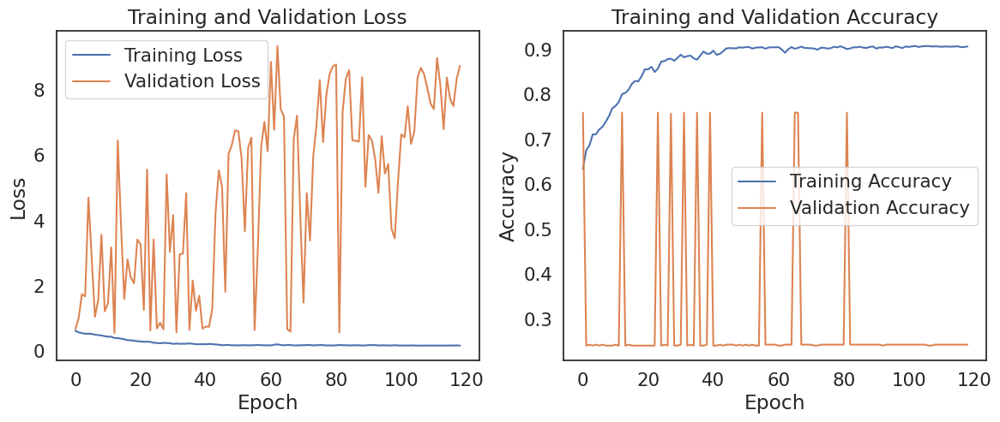

Epoch 119 : Learning rate = 0.0002500000118743628
88/88 ━━━━━━━━━━━━━━━━━━━━ 43s 485ms/step - binary_accuracy: 0.9017 - f1_score: 0.6615 - loss: 0.1758 - recall: 0.8025 - val_binary_accuracy: 0.2431 - val_f1_score: 0.3884 - val_loss: 8.7227 - val_recall: 1.0000


In [30]:
# Train the model with early stopping callback
history = model.fit(
    X_train,
    y_train,
    epochs=epochs,
    validation_data=(X_val, y_val),
    shuffle=True,
    callbacks=callbacks
).history

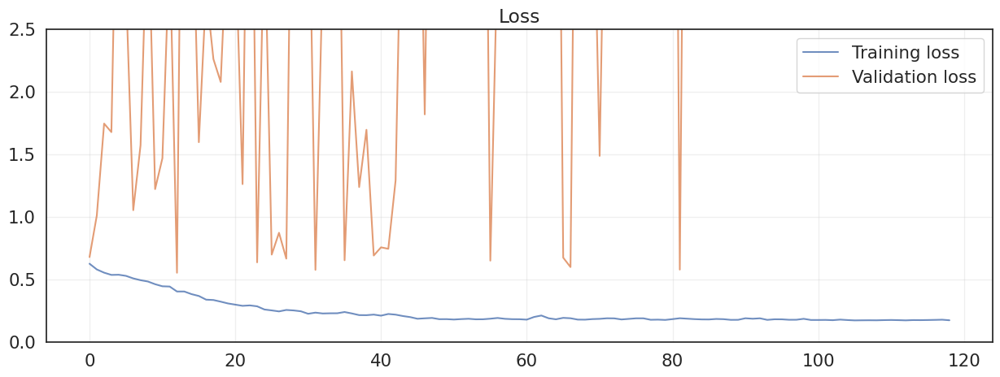

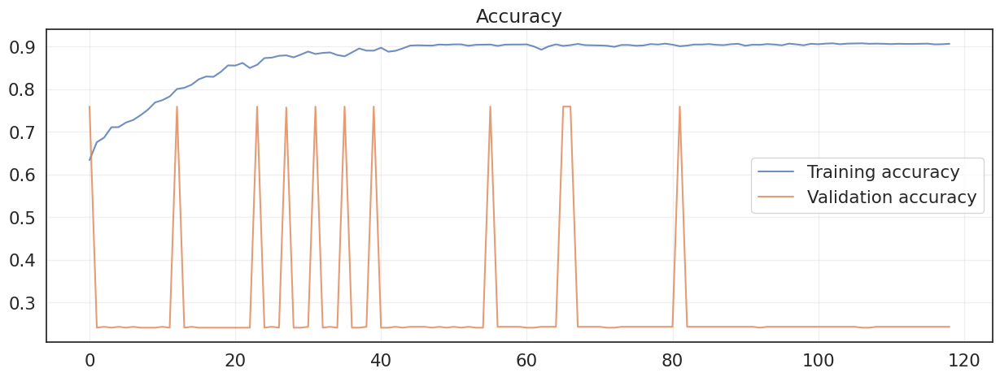

In [33]:
# Plot training and validation loss
plt.figure(figsize=(15, 5))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.ylim(top=2.5, bottom=0.0)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 5))
plt.plot(history['binary_accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_binary_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [34]:
# Save the trained model to a file with the accuracy included in the filename
with strategy.scope():
    model_weights_filename = 'MODEL.weights.h5'
    model.save_weights(model_weights_filename)

In [35]:
LABELS = [0, 1, 2, 3, 4]

In [36]:
def evaluations(model, ds, y_ds, labels, name):
    # Predict class probabilities and get predicted classes
    ds_predictions = model.predict(ds, verbose=0)
    ds_predictions = np.argmax(ds_predictions, axis=-1)
    
    # Extract ground truth classes
    ds_gt = np.argmax(y_ds, axis=-1)
    
    # Calculate and display training set accuracy
    ds_accuracy = accuracy_score(ds_gt, ds_predictions)
    print(f'Accuracy score over the {name} set: {round(ds_accuracy, 4)}')
    
    # Calculate and display training set precision
    ds_precision = precision_score(ds_gt, ds_predictions, average='weighted')
    print(f'Precision score over the {name} set: {round(ds_precision, 4)}')
    
    # Calculate and display training set recall
    ds_recall = recall_score(ds_gt, ds_predictions, average='weighted')
    print(f'Recall score over the {name} set: {round(ds_recall, 4)}')
    
    # Calculate and display training set F1 score
    ds_f1 = f1_score(ds_gt, ds_predictions, average='weighted')
    print(f'F1 score over the {name} set: {round(ds_f1, 4)}')
    
    # Compute the confusion matrix
    # cm = confusion_matrix(ds_gt, ds_predictions)
    
    # Create labels combining confusion matrix values
    # labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)
    
    # # Plot the confusion matrix with class labels
    # plt.figure(figsize=(8, 6))
    # sns.heatmap(cm, annot=labels, fmt='', xticklabels=labels, yticklabels=labels, cmap='Blues')
    # plt.xlabel('True labels')
    # plt.ylabel('Predicted labels')
    # plt.show()

In [37]:
evaluations(model, ds=X_val, y_ds=y_val, labels=LABELS, name='validation')

Accuracy score over the validation set: 1.0
Precision score over the validation set: 1.0
Recall score over the validation set: 1.0
F1 score over the validation set: 1.0


## FINE TUNNING

In [ ]:
model.get_layer('efficientnetb0').trainable = True  

with strategy.scope():
    # Recompile the model with a smaller learning rate for fine-tuning
    model.compile(
        optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-5, weight_decay=4e-4),
        loss=tfk.losses.BinaryFocalCrossentropy(),
        metrics=[tfk.metrics.BinaryAccuracy()]
    )

history = model.fit(
    X_train,
    y_train,
    epochs=epochs,
    validation_data=(X_val, y_val),
    shuffle=True,
    callbacks=callbacks
).history

In [ ]:
# Save the trained model to a file with the accuracy included in the filename
with strategy.scope():
    model_weights_filename = 'FINE_MODEL.weights.h5'
    model.save_weights(model_weights_filename)

In [ ]:
evaluations(model, ds=X_val, y_ds=y_val, labels=LABELS, name='validation')